In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

## Gibbs sampler

In [ ]:
def gibbs(data_consts, init_params, full_conds, chain_length, rng):
    # save shape and flatten init_params
    shape = init_params.shape
    init_params = init_params.flatten()

    # initialize chains
    chains = np.empty((len(init_params), chain_length))
    chains[:,0] = init_params

    # create chains
    for step in range(1, chain_length):
        # update each parameter one-by-one
        for i,_ in enumerate(init_params):
            # extract latest parameters 
            latest_lt_i = chains[:i,step]     # latest parameters < i
            latest_ge_i = chains[i:,step - 1] # latest parameters >= i

            # update parameter i
            chains[i, step] = full_conds(i, (latest_lt_i, latest_ge_i), data_consts, rng)

    # restore original shape
    return chains.reshape(shape + (chain_length,))

## Mean Field approximation 

### Warmup

We will first simulate $100$ independent observations from the model 

$$
y\sim N(\mu, \tau^{-1})
$$

with $\mu=3$ and $\tau^{-1}=0.5$.

We then treat $\mu$ and $\tau^{-1}$ as unknown and use the mean field approximation algorithm to estimate them.

#### Simulate Data

In [31]:
#Set parameters and simulate data
n = 100
mu = 3
tau = 2
std = np.sqrt(1/tau)
np.random.seed(4)
y = mu + std*np.random.randn(n)

#Set prior hyperparameters
m0 = 0
omega = 1 #unit information prior
a0 = 0.001
b0 = 0.001


# get sufficient stats
Sy = np.sum(y)
Sy2 = np.sum(y**2)
m02 = m0**2

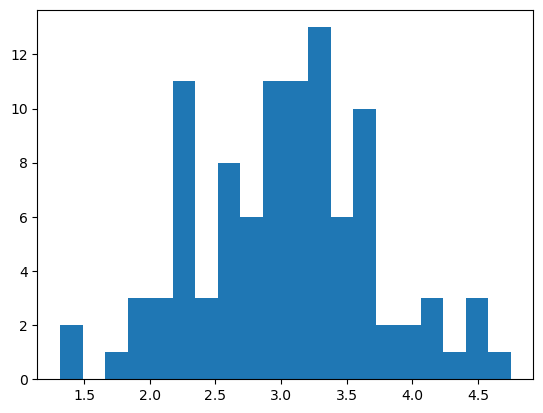

In [32]:
plt.hist(y, bins = 20)
plt.show()

#### Implement the algorithm

In [33]:
# general mean field variational inference
def mean_field(z_init, update, elbo, tolerance = 1e-6, z_conv = False):
    # initial values
    z = z_init

    # run until convergence
    converged = False
    while not converged:
        z_new = update(z)
        converged = ((elbo(z_new) - elbo(z) < tolerance).all() or              # elbo convergence
                     (z_conv and (np.abs(z_new - z) < tolerance).all())) # parameter convergence
        z = z_new
    return z

The derivation of the update functions and ELBO can be found in the corresponding section in the report.

In [34]:
# define update functions
def update_msab(params):
    # unpack parameters
    _, _, a, b = params

    # update mu parameters
    s_new = n * a/b + omega
    m_new = (a/b)/s_new * Sy

    # update tau parameter
    a_new = a0 + n/2 # constant
    b_new = b0 + 1/2 * Sy2 - m_new * Sy + n/2 * (1/s_new + m_new**2)

    return np.array([m_new, s_new, a_new, b_new])

# define ELBO
def elbo_msab(params):
    # unpack parameters
    m, s, a, b = params

    # compute ELBO (up to constant)
    return -2 * a - 1/2 * (omega/s + (omega + s) * m**2) + m * a/b * Sy

# run mean field variational inference
m, s, a, b = mean_field((m0, omega, a0, b0), update_msab, elbo_msab)
print(m,s,a,b)

3.010369327247257 207.57369571188312 50.001 23.916518388455415


#### Estimate $μ$ and $τ$

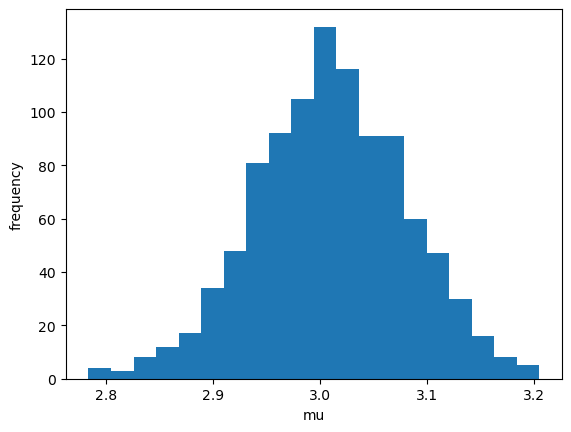

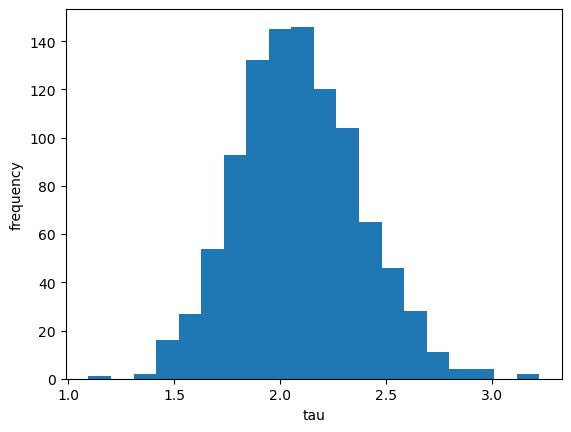

In [29]:
rng = np.random.default_rng(seed = 4)

mu_samples = rng.normal(m, np.sqrt(1/s), 1000)
plt.hist(mu_samples, bins = 20)
plt.xlabel('mu')
plt.ylabel('frequency')
plt.show()

tau_samples = rng.gamma(a, 1/b, 1000)
plt.hist(tau_samples, bins = 20)
plt.xlabel('tau')
plt.ylabel('frequency')
plt.show()

### Warmup 2

Let $y=(y_1, \dots, y_n)$ be independent Poisson($\lambda$) observations. Assume that $\lambda$ follows the Gamma($2,\beta$) distribution, where $\beta$ follows the Exponential($1$) distribution. The aim is to draw inference from the posterior $\pi(\theta|y)$, where $\theta=(\lambda, \beta)$. 

In [36]:
#Set parameters and simulate data
n = 100
np.random.seed(1)
beta_true = np.random.exponential(1,1)
lambda_true  = np.random.gamma(2,1/beta_true,1)
print('beta value: ',beta_true,' lambda value: ',lambda_true)
y = np.random.poisson(lambda_true,n)

# get sufficient stats
sy = np.sum(y)
print('ybar: ',sy/n)

beta value:  [0.53960584]  lambda value:  [1.53955169]
ybar:  1.41


The variational Bayes algorithm **approximates** $\pi(\theta|y)$ using the mean field approximation 

$$
q(\theta|y, \phi)=q(\lambda|y, \phi)q(\beta|y, \phi)
$$

It can be shown that such an algorithm may consist of the following steps

 1. Initialise at $q(\lambda)$ to be the Gamma($a_{\lambda},b_{\lambda}$) and $q(\beta)$ to be the Gamma($a_{\beta},b_{\beta}$) distribution, setting $$a_{\lambda}=2+\sum_iy_i,\;\; b_{\lambda}=b_{\lambda}^0,\;\;\;a_{\beta}=3,\;\text{ and }\;\;b_{\beta}=b_{\beta}^0. $$
 2. Iteratively update $b_{\lambda}$ and $b_{\beta}$ until the parameters or the ELBO converge. At iteration $i$ will have:
 
    a. Set $$b_{\lambda}^{i}=n+\mathbb{E}_{q(\beta)}[\beta]=n+3/b_{\beta}^{i-1}$$
    
    b. Set $$b_{\beta}^{i}=1+\mathbb{E}_{q(\lambda)}[\lambda]=1+(2+\sum_iy_i)/b_{\lambda}^{i}$$

#### Estimate $β$ and $λ$

The derivation of the ELBO can be found in the corresponding section in the report.

In [37]:
# initialise parameters
b_lambda = b_beta = 1
a_lambda = 2 + sy     # constant
a_beta = 3            # constant

# define update functions
def update_beta_lambda(params):
    # unpack parameters
    _, b_beta = params

    # update parameters
    b_lambda_new = n + 3/b_beta
    b_beta_new = 1 + (2 + sy)/b_lambda_new

    return np.array([b_lambda_new, b_beta_new])

# define ELBO
def elbo_beta_lambda(params):
    # unpack parameters
    b_lambda, b_beta = params

    # compute ELBO (up to constant)
    return -a_lambda/b_lambda - (a_lambda * a_beta)/(b_lambda * b_beta) - a_beta/b_beta - a_lambda - a_beta

# run mean field variational inference
b_lambda, b_beta = mean_field([b_lambda, b_beta], update_beta_lambda, elbo_beta_lambda, z_conv = True)
print(a_lambda,b_lambda,a_beta,b_beta)

143 101.2560975609756 3 2.412260628688426


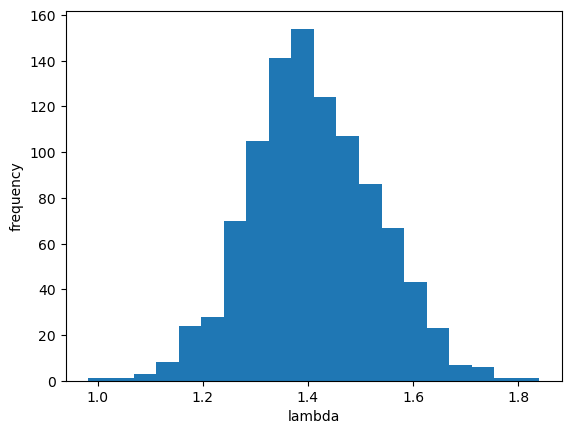

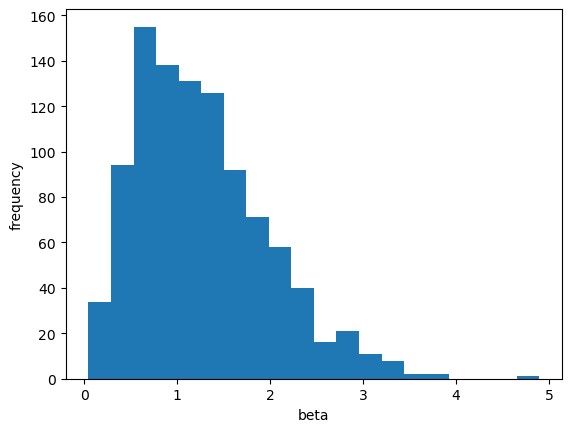

In [38]:
rng = np.random.default_rng(seed = 4)

lambda_samples = rng.gamma(a_lambda, 1/b_lambda, 1000)
plt.hist(lambda_samples, bins = 20)
plt.xlabel('lambda')
plt.ylabel('frequency')
plt.show()

beta_samples = rng.gamma(a_beta, 1/b_beta, 1000)
plt.hist(beta_samples, bins = 20)
plt.xlabel('beta')
plt.ylabel('frequency')
plt.show()

## Image denosing with Gibbs sampling

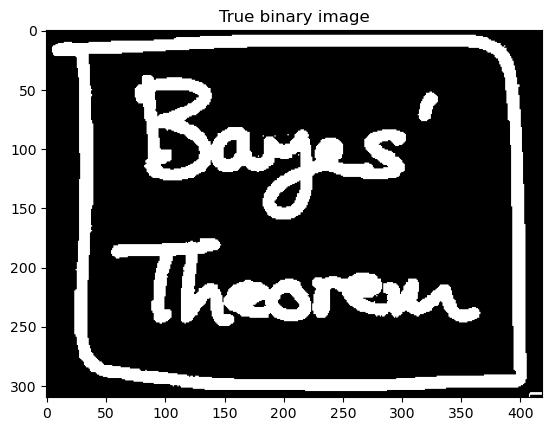

In [39]:
#load image data
data = Image.open('bayes.bmp')
temp = np.double(data)
temp_mean = np.mean(data)
clean_img = +1*(temp>temp_mean) + -1*(temp<temp_mean)

plt.figure()
plt.imshow(clean_img,cmap='Greys')
plt.title("True binary image")
plt.show()

310 419


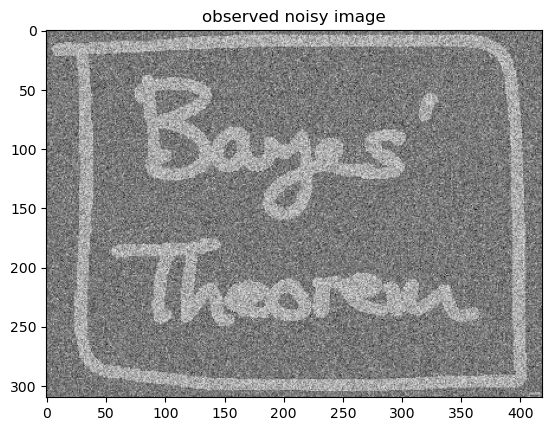

In [40]:
height,width = clean_img.shape
print(height,width)
sigma  = 1  #noise level
noisy_img = clean_img + sigma*np.random.randn(height, width)
plt.figure()
plt.imshow(noisy_img, cmap='Greys')
plt.title("observed noisy image")
plt.show()

### Theory

Initialization: $\{x_i : i = 1, \ldots, M\}$ to some initial values $\{x^{(1)}_i\}$, e.g., $x^{(1)}_i = +1$ and $x^{(1)}_i = -1$ with probability $\frac{1}{2}$.

For $\tau = 1, \ldots, T$ repeat:


1. Sample $x^{(\tau+1)}_1 \sim p(x_1 | x^{(\tau)}_2, x^{(\tau)}_3, \ldots, x^{(\tau)}_M, y_1)$
2. Sample $x^{(\tau+1)}_2 \sim p(x_2 | x^{(\tau+1)}_1, x^{(\tau)}_3, \ldots, x^{(\tau)}_M, y_2)$
   
   $\vdots$

. Sample $x^{(\tau+1)}_M \sim p(x_M | x^{(\tau+1)}_1, x^{(\tau+1)}_2, \ldots, x^{(\tau+1)}_{M-1}, y_M)$


$$
p(x_i = +1 | x_{\setminus i}, y) = \frac{\exp\left(\beta \sum_{j \in N(i)} x_j + \eta y_i\right)}{\exp\left(\beta \sum_{j \in N(i)} x_j + \eta y_i\right) + \exp\left(-\beta \sum_{j \in N(i)} x_j - \eta y_i\right)} = \sigma\left(2\left(\eta y_i + \beta \sum_{j \in N(i)} x_j\right)\right)
$$


In [41]:
rng = np.random.default_rng(seed = 4)
import math # math.exp faster than np.exp for scalars

# precompute mask for valid indices
indices = np.arange(height * width)
neighbour_indices = np.column_stack((indices - 1, indices + 1, indices - width, indices + width))
valid_mask = (neighbour_indices >= 0) & (neighbour_indices < height * width)

# denoise image using Gibbs sampler
def denoise_gibbs(noisy_img, iterations = 10, eta = 1, beta = 1, rng = rng):
    # define full conditional distributions
    def full_conds_x(i, flat_latest_img, flat_noisy_img, rng):
        # get valid neighbour indices and split into < i and >= i
        valid_indices = neighbour_indices[i, valid_mask[i]]
        valid_indices_lt_i = valid_indices[valid_indices < i]
        valid_indices_ge_i = valid_indices[valid_indices >= i]

        # get neighbours and compute sum
        neighbours_lt_i = flat_latest_img[0][valid_indices_lt_i]
        neighbours_ge_i = flat_latest_img[1][valid_indices_ge_i - i]
        sum_neighbours = sum(neighbours_lt_i) + sum(neighbours_ge_i)

        # compute probability of x_i = 1
        p_plus = 1/(1 + math.exp(-2 * (eta * flat_noisy_img[i] + beta * sum_neighbours)))

        # sample from full conditional distribution
        # rng.choice([1,-1], p = [p_plus, 1 - p_plus]) much slower
        return 2 * rng.binomial(1, p_plus) - 1
                
    # run Gibbs sampler
    pixel_chains = gibbs(noisy_img.flatten(), noisy_img, full_conds_x, iterations, rng)

    # return denoised image (mean of last five samples)
    return np.mean(pixel_chains[...,-5:], axis = 2)

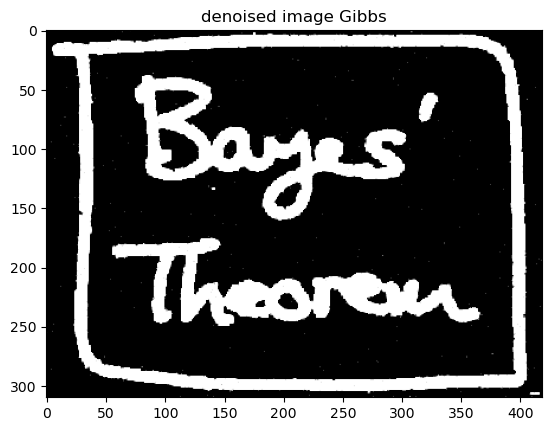

In [42]:
denoised_gibbs = denoise_gibbs(noisy_img)
plt.imshow(denoised_gibbs, cmap='Greys')
plt.title("denoised image Gibbs")
plt.show()

### Effect of different noise levels vs normalized mean squared error (NMSE)


In [18]:
# number of samples
n = 10

# computes denoised images for different parameters
def multi_denoise(denoiser, sigmas = np.ones(n), betas = np.ones(n), etas = np.ones(n)):
    # generate noisy images
    rng = np.random.default_rng(seed = 4)
    noisy_imgs = clean_img + np.tensordot(sigmas, rng.standard_normal((height, width)), axes = 0)

    # denoise images
    return ([(print(f"Denoising image {i + 1} of {n}"), 
              denoiser(noisy_imgs[i], eta = etas[i], beta = betas[i]))[-1] 
             for i in range(n)], 
            noisy_imgs)
        
# computes nmse for multiple denoised images
def nmses(denoised, clean): 
    repeat_clean = np.broadcast_to(clean, (len(denoised), height, width))
    return (np.linalg.norm(denoised - repeat_clean, axis = (1,2))
            /np.linalg.norm(repeat_clean, axis = (1,2)))

# plot images and nmse for different parameters
def nmse_plots(denoiser, num_points = 10):
    # define sigmas, betas, etas
    sigmas = betas = etas = np.logspace(-1, 1, num_points)

    # compute images
    sigma_denoised_imgs, noisy_imgs = multi_denoise(denoiser, sigmas)
    beta_denoised_imgs, _ = multi_denoise(denoiser, betas = betas)
    eta_denoised_imgs, _ = multi_denoise(denoiser, etas = etas)

    # plot images for different noise levels
    for i, (denoised, noisy) in enumerate(zip(sigma_denoised_imgs, noisy_imgs)):
        print(f"noise: {sigmas[i]}")

        # noisy images
        plt.imshow(noisy, cmap='Greys')
        plt.title("observed noisy image")
        plt.show()

        # denoised images
        plt.imshow(denoised, cmap='Greys')
        plt.title("denoised image")
        plt.show()

    # plots 
    plt.plot(sigmas, nmses(sigma_denoised_imgs, clean_img))
    plt.plot(betas, nmses(beta_denoised_imgs, clean_img))
    plt.plot(etas, nmses(eta_denoised_imgs, clean_img))
    plt.legend(['sigma', 'beta', 'eta'])
    plt.ylabel('nmse')
    plt.show()

### Effect of different parameters in the energy function, e.g., $ \beta, \eta$
1. NMSE vs $ \beta$
2. NMSE vs $ \eta$

Denoising image 1 of 10
Denoising image 2 of 10
Denoising image 3 of 10
Denoising image 4 of 10
Denoising image 5 of 10
Denoising image 6 of 10
Denoising image 7 of 10
Denoising image 8 of 10
Denoising image 9 of 10
Denoising image 10 of 10
Denoising image 1 of 10
Denoising image 2 of 10
Denoising image 3 of 10
Denoising image 4 of 10
Denoising image 5 of 10
Denoising image 6 of 10
Denoising image 7 of 10
Denoising image 8 of 10
Denoising image 9 of 10
Denoising image 10 of 10
Denoising image 1 of 10
Denoising image 2 of 10
Denoising image 3 of 10
Denoising image 4 of 10
Denoising image 5 of 10
Denoising image 6 of 10
Denoising image 7 of 10
Denoising image 8 of 10
Denoising image 9 of 10
Denoising image 10 of 10
noise: 0.1


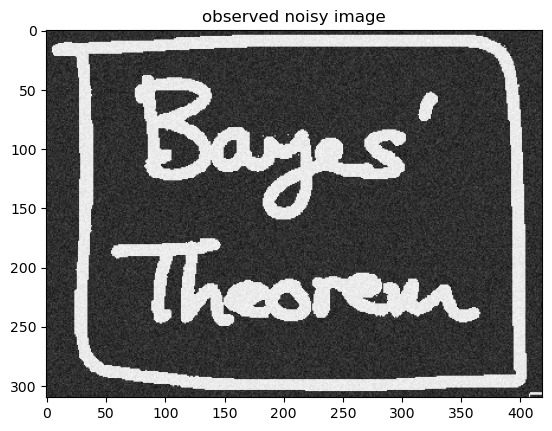

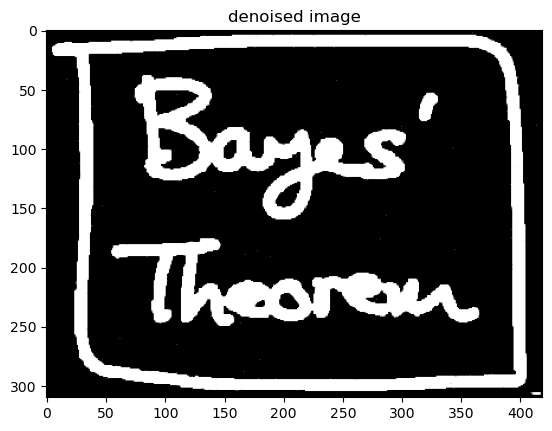

noise: 0.16681005372000587


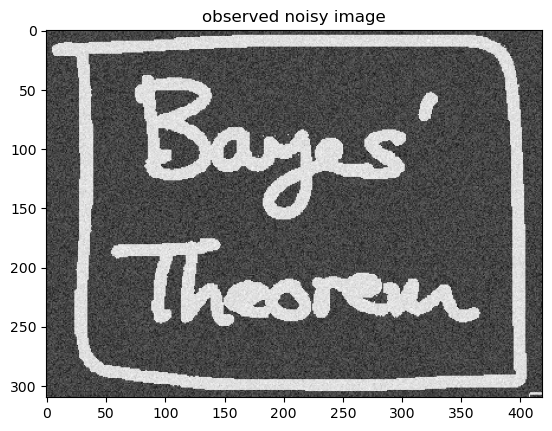

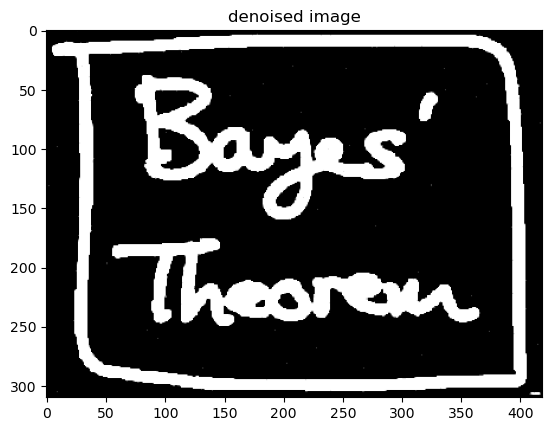

noise: 0.2782559402207124


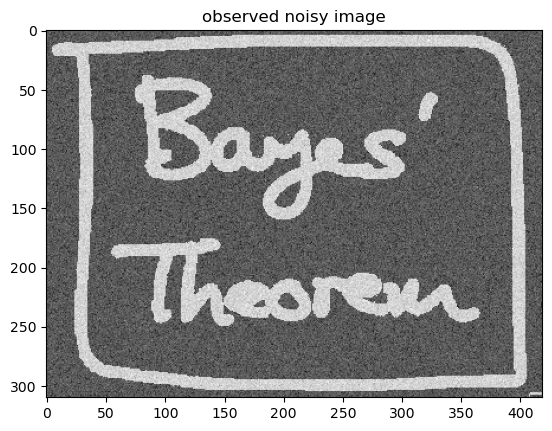

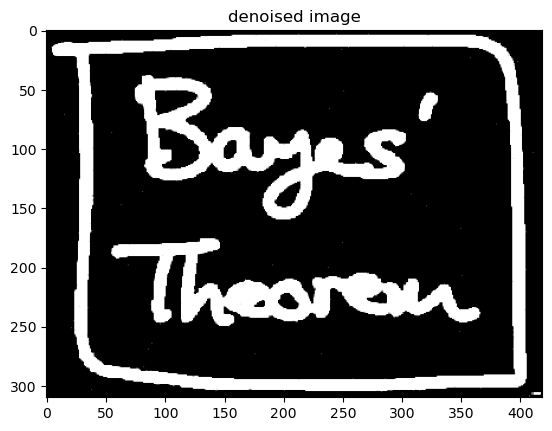

noise: 0.46415888336127786


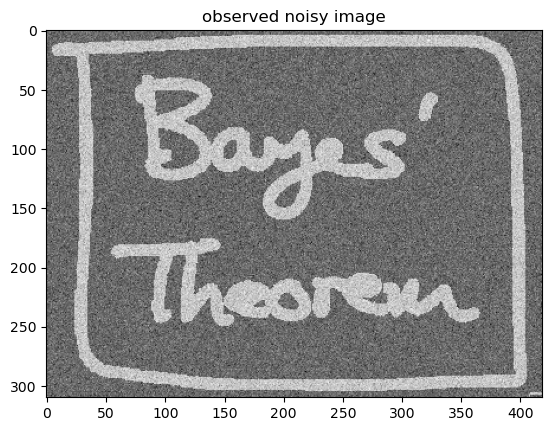

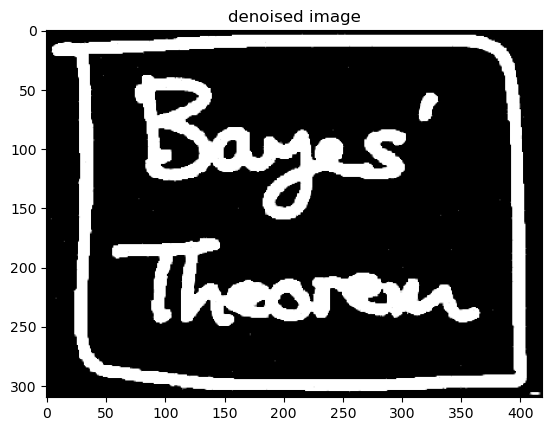

noise: 0.774263682681127


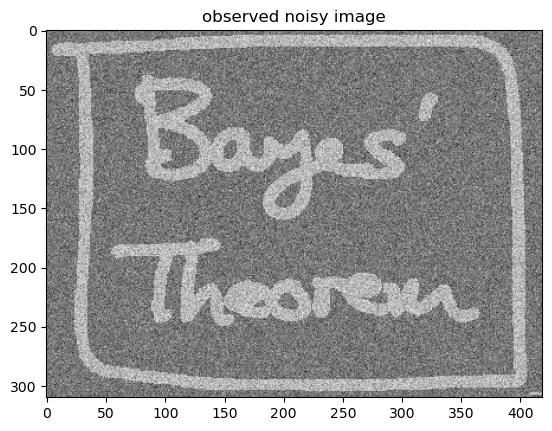

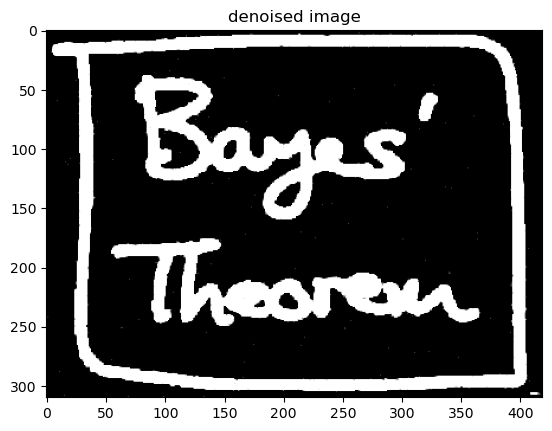

noise: 1.291549665014884


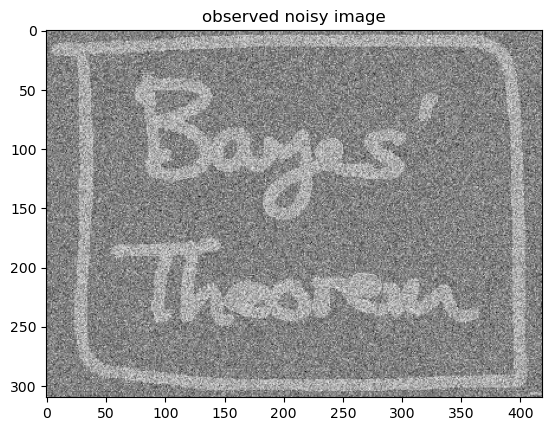

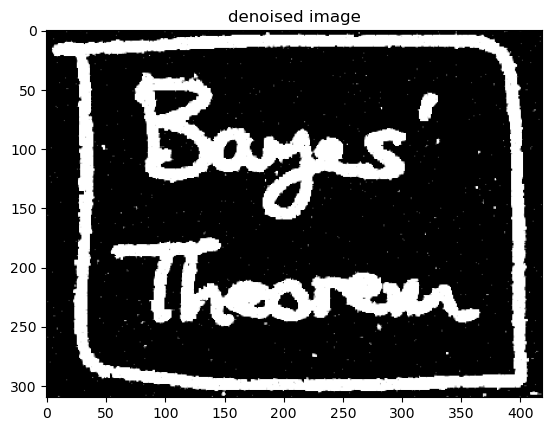

noise: 2.1544346900318834


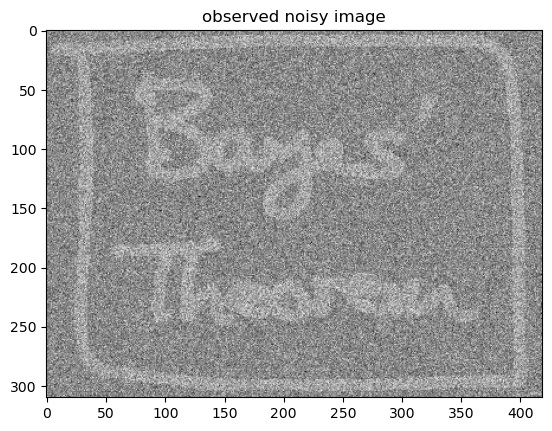

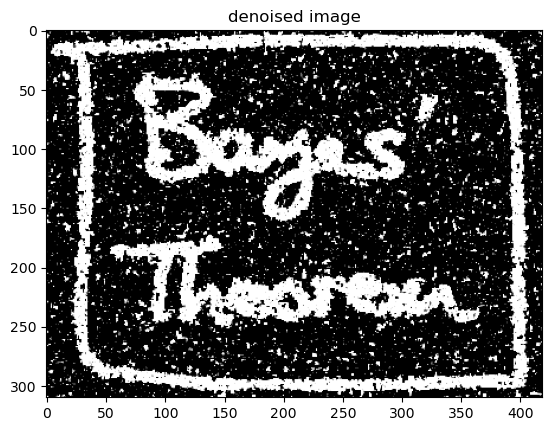

noise: 3.593813663804626


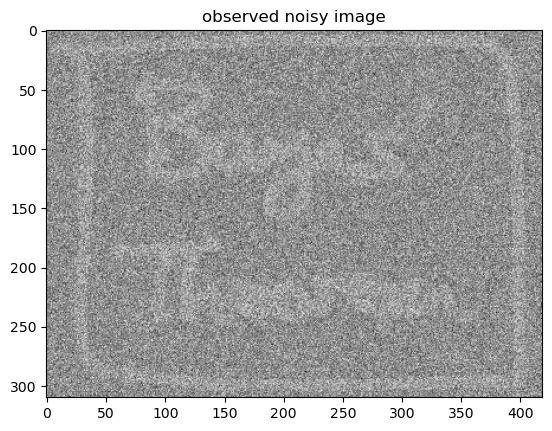

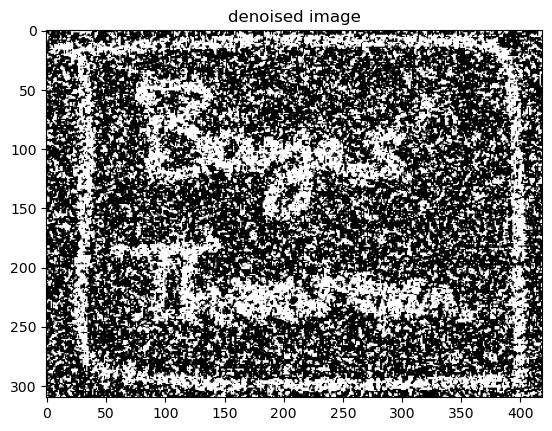

noise: 5.994842503189409


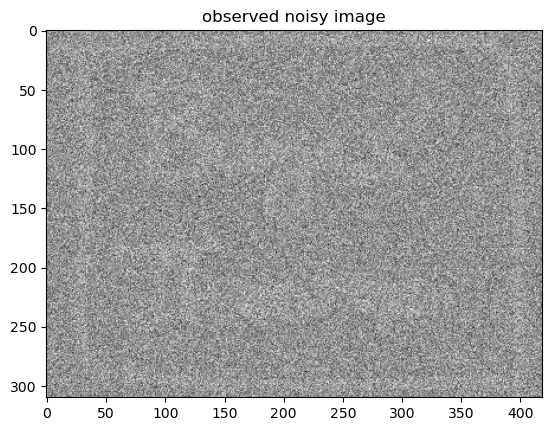

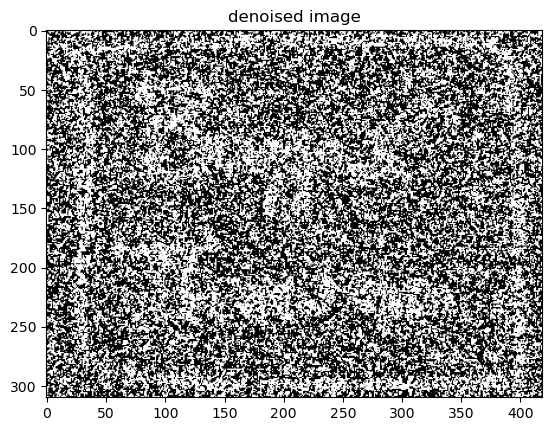

noise: 10.0


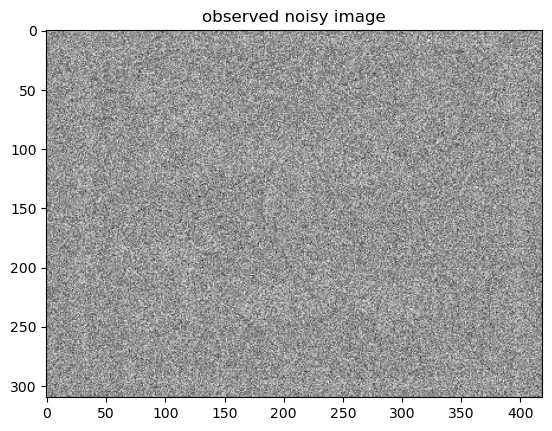

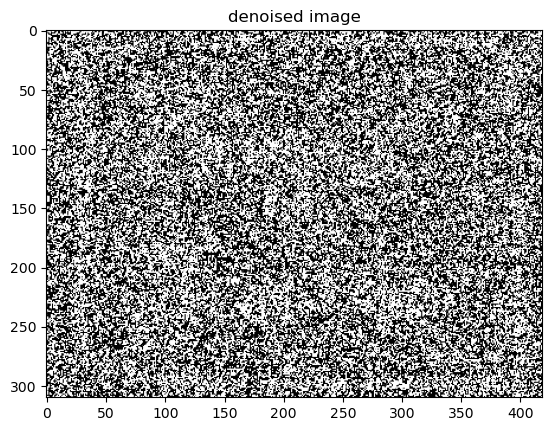

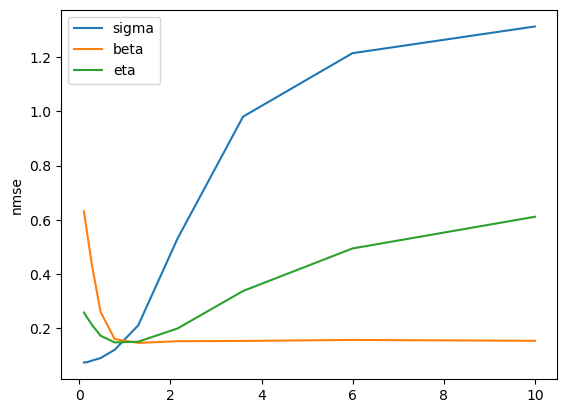

In [19]:
# running this takes a while
nmse_plots(denoise_gibbs)

## Image denosing with Mean-field approximation

Now, we try to apply mean-field approximation to denoise the image.
The posterior for Ising model has the following form
$$P(x\mid y) = \frac{1}{Z}exp(-E(x))$$
where
$$E(x) = E_{0}(x) - \sum_{i}L_{i}(x_{i}) \;\;\;\;\;\; E_{0}(x) = - \beta\sum_{i,j}x_{i}x_{j},\;\;\;  L_{i}(x_{i}) = \eta\sum_{i}x_{i}y_{i}$$
In mean-field approximation, we try to approximate this posterior by a fully factored approximation
$$q(x) = \prod_{i}q(x_{i}, \mu_{i})$$
where $\mu_{i}$ is the mean value of node $i$. To derive the update for the variational parameter $\mu_{i}$, we
first write out $log\tilde{p}(x) = -E(x)$, dropping terms that do not involve $x_{i}$:
$$log\tilde{p}(x) = \beta x_{i} \sum_{j}x_{j} + L_{i}(x_{i}) + const$$
This only depends on the states of the neighboring nodes. Now we take expectations of this wrt
$ \prod_{j\neq i}q(x_{i})$ to get
$$q(x_{i}) \propto exp(x_{i}\sum_{j}\beta \mu_{j} + L_{i}(x_{i})) $$
Thus we replace the states of the neighbors by their average values. Let
$$ m_{i} = \sum_{j} \beta \mu_{j} $$
be the mean field influence on node $i$. Also, let $L_{i}^{+}=L_{i}(1)$ and $L_{i}^{-}=L_{i}(-1)$. The
approximate marginal posterior is given by
$$q_{i}(x_{i}=1)=\frac{exp(m_{i}+L_{i}^{+})}{exp(m_{i}+L_{i}^{+})+exp(-m_{i}+L_{i}^{-})}=sigm(2a_{i}),\;\;\;\;\;\;a_{i}=m_{i}+0.5(L_{i}^{+}-L_{i}^{-})  $$
Similarly, we have $q_{i}(x_{i}=-1) = sigm(-2a_{i})$. From this we can compute the new mean for
site $i$:
$$\mu_{i} = \mathbb{E}_{q_{i}}[x_{i}] =q_{i}(x_{i}=+1)(+1) + q_{i}(x_{i}=-1)(-1) = tanh(a_{i})$$
Hence the update equation becomes
$$\mu_{i} = tanh(\sum_{j} \beta \mu_{j}+0.5(L_{i}^{+}-L_{i}^{-}) )$$
We can turn the above equations in to a fixed point algorithm by writing
$$\mu_{i}^{t} = tanh(\sum_{j} \beta \mu_{j}^{t-1}+0.5(L_{i}^{+}-L_{i}^{-}) )$$
It is usually better to use damped updates of the form
$$\mu_{i}^{t} = (1-\lambda)\mu_{j}^{t-1} + \lambda tanh(\sum_{j} \beta \mu_{j}^{t-1}+0.5(L_{i}^{+}-L_{i}^{-}) ) ,\;\;\;\;\;\; 0<\lambda<1$$

### Noise Level Analysis (Again)

The derivation of the ELBO can be found in the corresponding section in the report.

In [20]:
# helper function to sum over neighbours
def sum_neighbours(x):
    # pad all axes with one 0 on each side
    xp = np.pad(x, 1)

    # shift x up, down, left, and right
    shifted_xp = [np.roll(xp, shift, (0,1)) for shift in [(1,0), (-1,0), (0,1), (0,-1)]]
    
    # sum and remove padding
    return np.sum(shifted_xp, axis = 0)[1:-1,1:-1]

# denoise image using mean field variational inference
def denoise_mean_field(noisy_img, damp = 0.5, beta = 1, eta = 1):
    # initialize mu
    mu = noisy_img # or [rng.choice([-1,1]) for _ in range(height * width)]

    # define update function (0.5(L_i^+ - L_i^-) = eta * y_i))
    def update_mu(mu): 
        return (1 - damp) * mu + damp * np.tanh(beta * sum_neighbours(mu) + eta * noisy_img)

    # ELBO is simply the identity
    def elbo_mu(mu): 
        return mu

    # run mean field variational inference
    return mean_field(mu, update_mu, elbo_mu)

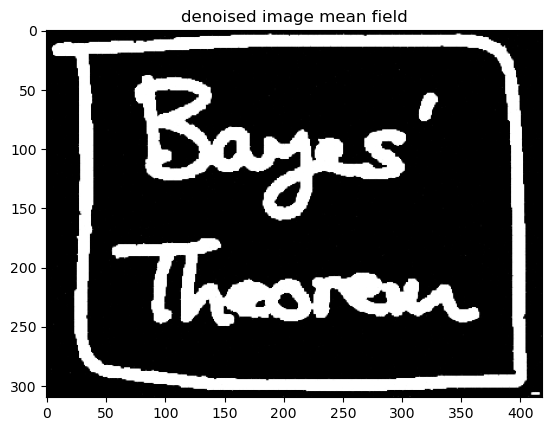

In [43]:
denoised_mfi = denoise_mean_field(noisy_img)
plt.imshow(denoised_mfi, cmap='Greys')
plt.title("denoised image mean field")
plt.show()

Denoising image 1 of 10
Denoising image 2 of 10
Denoising image 3 of 10
Denoising image 4 of 10
Denoising image 5 of 10
Denoising image 6 of 10
Denoising image 7 of 10
Denoising image 8 of 10
Denoising image 9 of 10
Denoising image 10 of 10
Denoising image 1 of 10
Denoising image 2 of 10
Denoising image 3 of 10
Denoising image 4 of 10
Denoising image 5 of 10
Denoising image 6 of 10
Denoising image 7 of 10
Denoising image 8 of 10
Denoising image 9 of 10
Denoising image 10 of 10
Denoising image 1 of 10
Denoising image 2 of 10
Denoising image 3 of 10
Denoising image 4 of 10
Denoising image 5 of 10
Denoising image 6 of 10
Denoising image 7 of 10
Denoising image 8 of 10
Denoising image 9 of 10
Denoising image 10 of 10
noise: 0.1


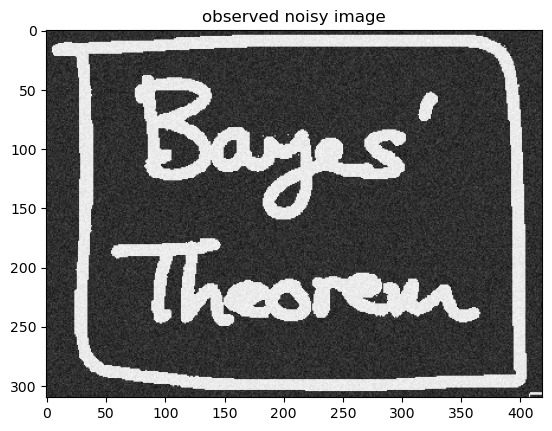

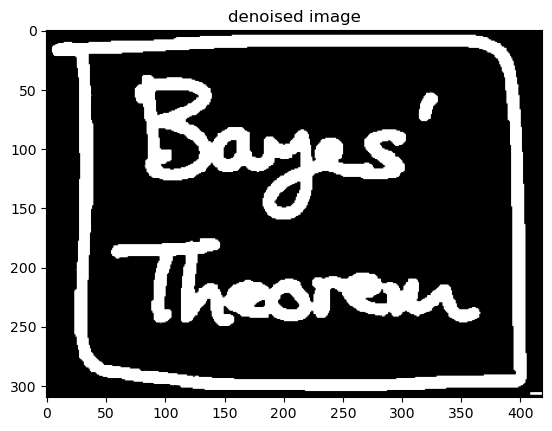

noise: 0.16681005372000587


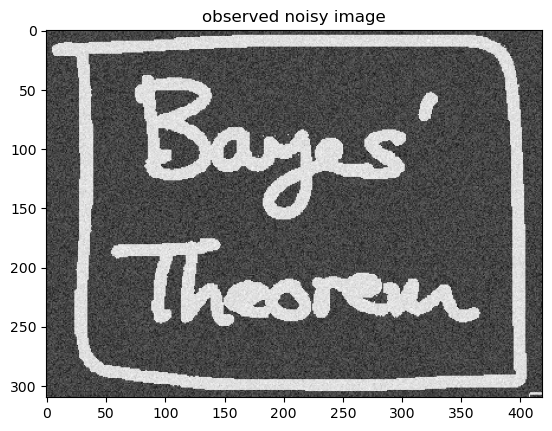

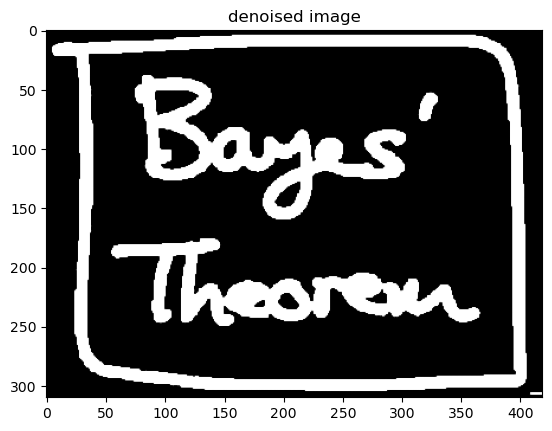

noise: 0.2782559402207124


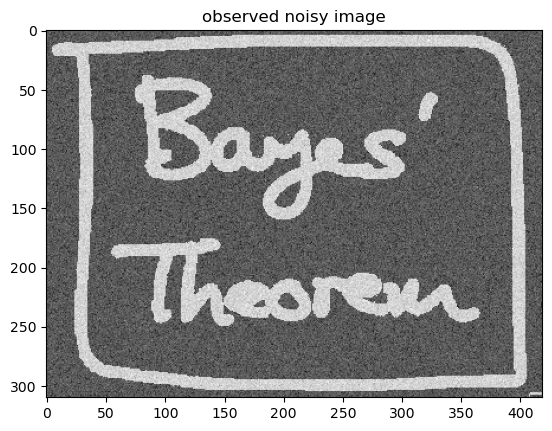

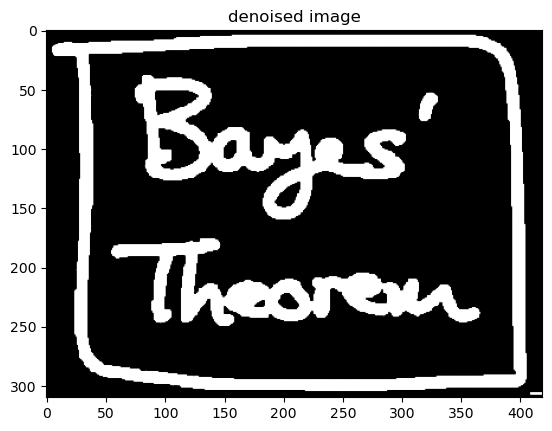

noise: 0.46415888336127786


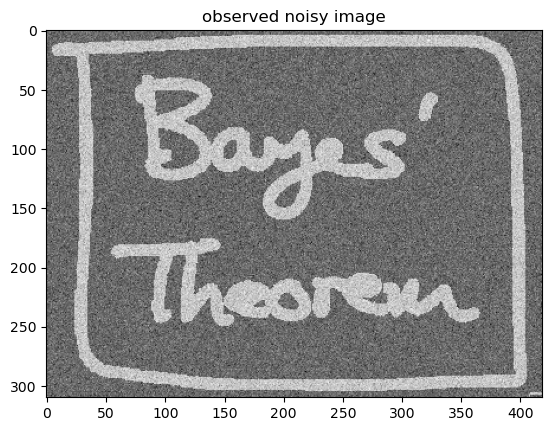

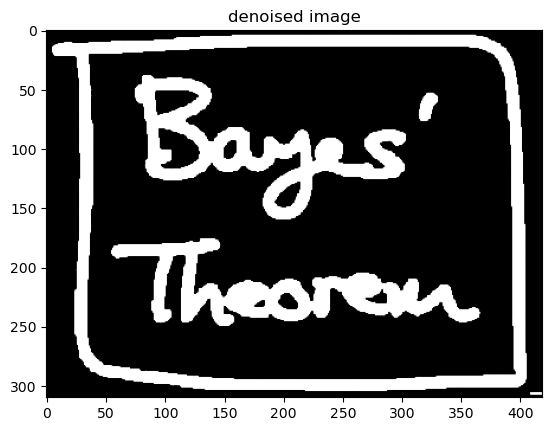

noise: 0.774263682681127


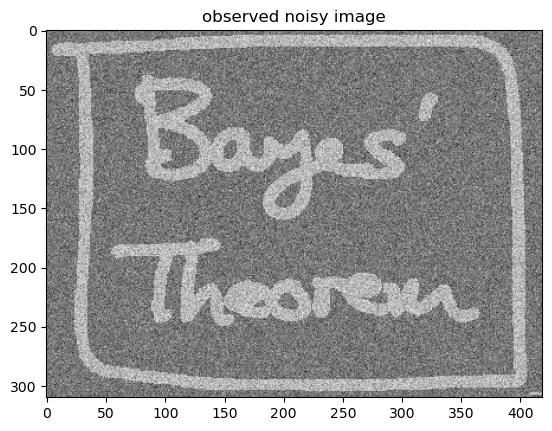

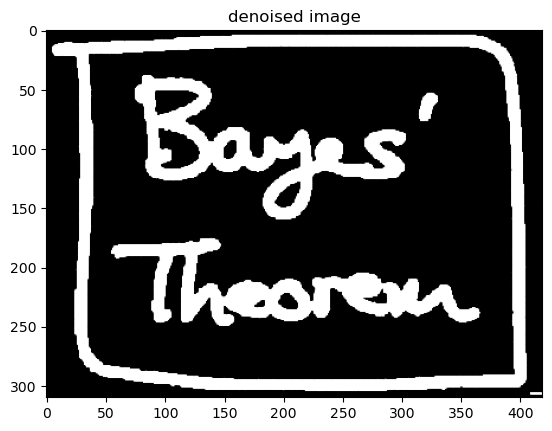

noise: 1.291549665014884


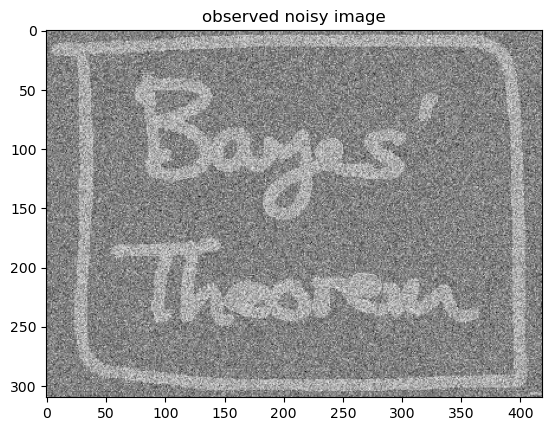

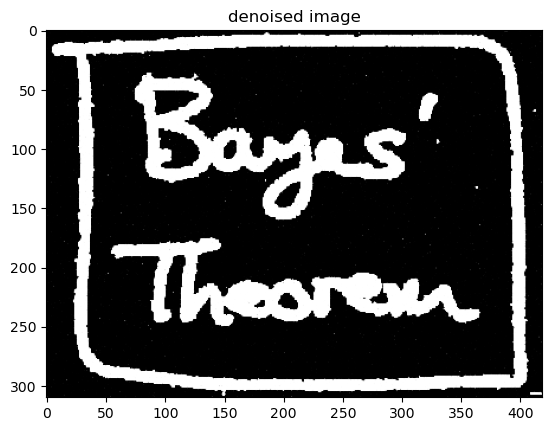

noise: 2.1544346900318834


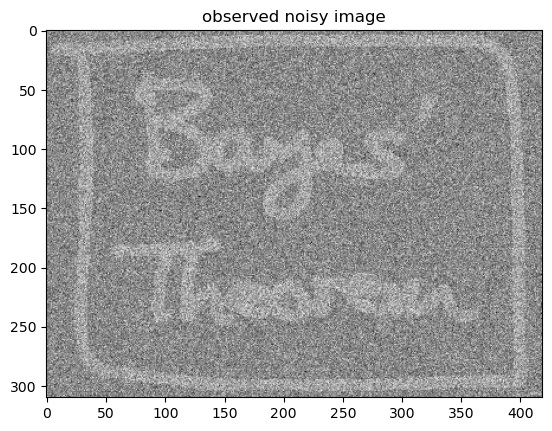

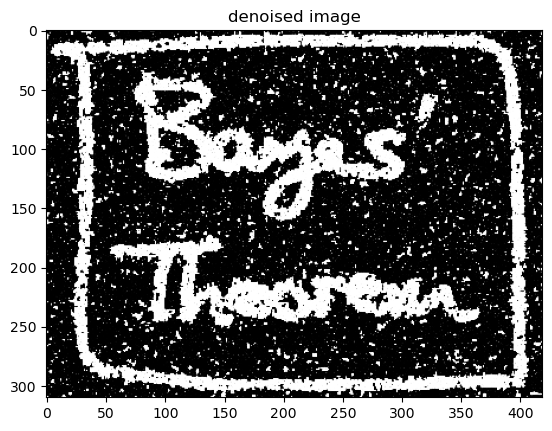

noise: 3.593813663804626


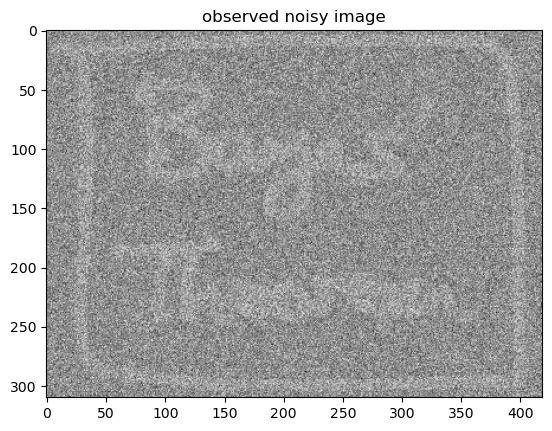

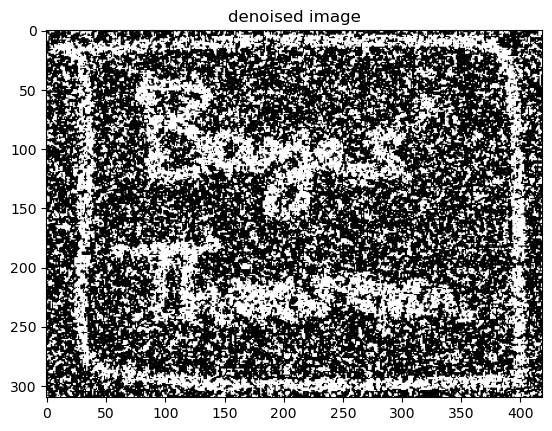

noise: 5.994842503189409


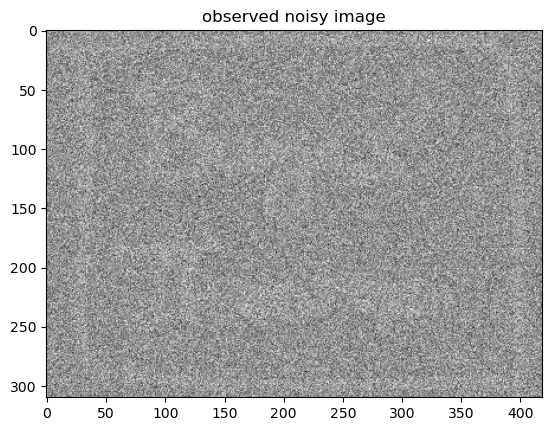

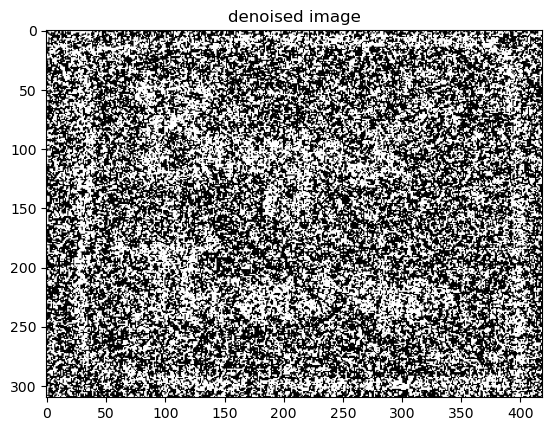

noise: 10.0


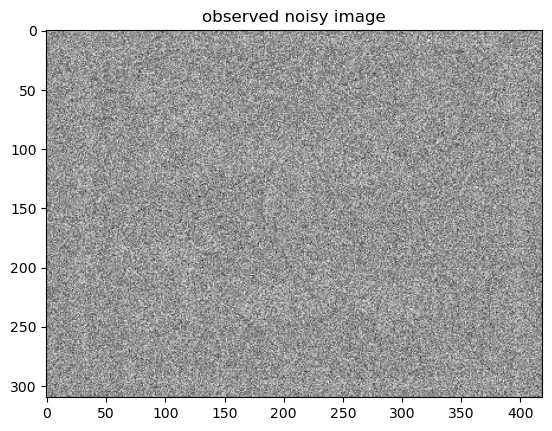

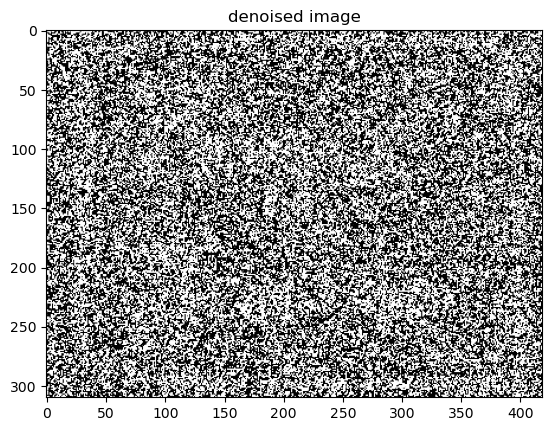

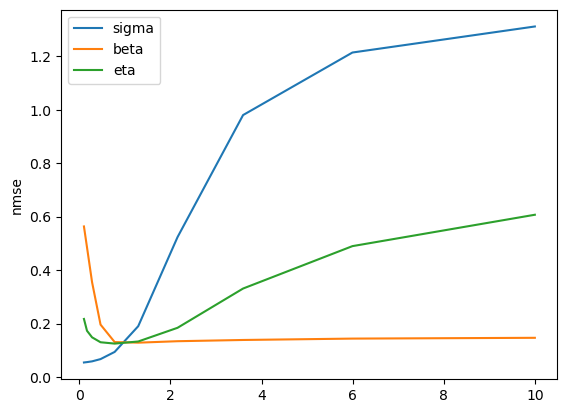

In [22]:
# running this takes a while
nmse_plots(denoise_mean_field)

## NMSE Comparison

The NMSE of the denoising schemes ICM, Gibbs sampling, and mean-field approximation were compared

In [ ]:
# precompute valid neighbour indices
heights = np.broadcast_to(np.arange(height), (width, height)).T
widths = np.broadcast_to(np.arange(width), (height,width))

# neighbour_indices[i,j] = [[i - 1, j], [i + 1, j], [i, j - 1], [i, j + 1]]
neighbour_indices = np.stack((np.stack((heights - 1, widths), axis = 2),
                              np.stack((heights + 1, widths), axis = 2),
                              np.stack((heights, widths - 1), axis = 2),
                              np.stack((heights, widths + 1), axis = 2)), 
                            axis = 2)
valid_mask = (np.all(neighbour_indices >= 0, axis = 3) # i, j >= 0
              & (neighbour_indices[...,0] < height)    # i < height
              & (neighbour_indices[...,1] < width))    # j < width

def denoise_icm(noisy_img, iterations = 100, h = 0.1, beta = 1, eta = 1):
    # initialize x and count
    x = noisy_img.copy()
    count = 0
    
    # run until convergence
    converged = False
    while not converged:
        # increment count
        count += 1

        # assume converged
        converged = True
        for i in range(height):
            for j in range(width):
                # store old value of x_ij
                old_x_ij = x[i,j]

                # get neighbours
                valid_indices = neighbour_indices[i,j, valid_mask[i,j]]
                neighbours = x[valid_indices[:,0], valid_indices[:,1]]

                # compute difference in energy (E_+ - E_-)
                delta_E = 2 * (h - beta * np.sum(neighbours) - eta * noisy_img[i,j])

                # set x_ij to 1 or -1 depending on the sign of delta_E
                x[i,j] = 1 if delta_E < 0 else -1

                # converged remains true if all x_ij did not change
                converged = converged and (old_x_ij == x[i,j])
        # stop after enough iterations
        converged = converged or count > iterations

    # return denoised image
    return x

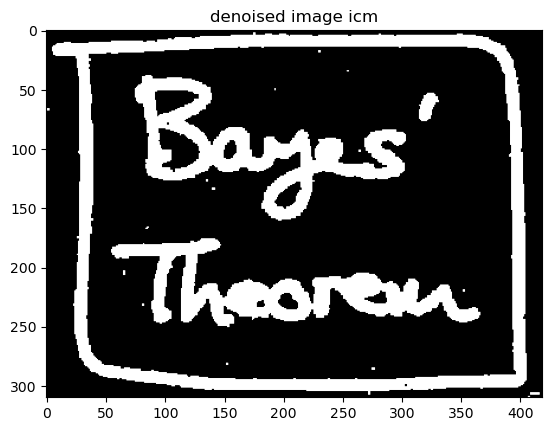

Gibbs nmse: 0.14514707246818706
Mean field nmse: 0.11922910458678378
ICM nmse: 0.16330560212646736


In [46]:
denoised_icm = denoise_icm(noisy_img)
plt.imshow(denoised_icm, cmap='Greys')
plt.title("denoised image icm")
plt.show()

print('Gibbs nmse:', nmses([denoised_gibbs], clean_img)[0])
print('Mean field nmse:', nmses([denoised_mfi], clean_img)[0])
print('ICM nmse:', nmses([denoised_icm], clean_img)[0])